In [1]:
import numpy as np
import torch
import os
from torch.utils.data import Dataset
from sklearn.preprocessing import LabelEncoder
import numpy as np
!pip3 install open3d
import open3d as o3d

use_cuda = torch.cuda.is_available()
print(use_cuda)
device = torch.device("cuda:0" if use_cuda else "cpu")



def find_neighbor(faces, faces_contain_this_vertex, vf1, vf2, except_face):
    for i in (faces_contain_this_vertex[vf1] & faces_contain_this_vertex[vf2]):
        if i != except_face:
            face = faces[i].tolist()
            face.remove(vf1)
            face.remove(vf2)
            return i

    return except_face

def input_stl(path):
    
    try:
        triangular_mesh = o3d.io.read_triangle_mesh(path)
        parameters = {}
        parameters["normals"] = np.array(triangular_mesh.triangle_normals)
        triangular_mesh.remove_duplicated_vertices()
        parameters["vertices"] = np.array(triangular_mesh.vertices)
        parameters["num_tri"] = int(parameters["normals"].shape[0])
        parameters["triangles"] = np.array(triangular_mesh.triangles)
        parameters["centroids"] = np.zeros((parameters["num_tri"],3))                 
        parameters["corners"] = np.zeros((parameters["num_tri"], 9))

        faces_contain_this_vertex = []    
        for i in range(parameters["vertices"].shape[0]):
            faces_contain_this_vertex.append(set([]))

        for i in range(parameters["num_tri"]):
            [v1, v2, v3] = parameters["triangles"][i]
            x1, y1, z1 = parameters["vertices"][v1]
            x2, y2, z2 = parameters["vertices"][v2]
            x3, y3, z3 = parameters["vertices"][v3]
            
            Gx = (x1 + x2 + x3) / 3
            Gy = (y1 + y2 + y3) / 3
            Gz = (z1 + z2 + z3) / 3

            parameters["centroids"][i] = [Gx, Gy, Gz]

            c1 = parameters["vertices"][v1] - parameters["centroids"][i]
            c2 = parameters["vertices"][v2] - parameters["centroids"][i]
            c3 = parameters["vertices"][v3] - parameters["centroids"][i]

            parameters['corners'][i] = np.concatenate((c1, c2, c3))

            faces_contain_this_vertex[v1].add(i)
            faces_contain_this_vertex[v2].add(i)
            faces_contain_this_vertex[v3].add(i)

            
        parameters["neigh_index"] = []
        for i in range(parameters['num_tri']):
            [v1, v2, v3] = parameters["triangles"][i]
            n1 = find_neighbor(parameters["triangles"], faces_contain_this_vertex, v1, v2, i)
            n2 = find_neighbor(parameters["triangles"], faces_contain_this_vertex, v2, v3, i)
            n3 = find_neighbor(parameters["triangles"], faces_contain_this_vertex, v3, v1, i)
            parameters["neigh_index"].append([n1, n2, n3])


        parameters["neigh_index"] = np.array(parameters["neigh_index"])
        #parameters["neigh_index"].sort(axis = 1)

        return parameters
    except:
        return False




     |████████████████████████████████| 4.6 MB 2.6 MB/s 
True


In [2]:
class MeshData(Dataset):

    def __init__(self,root_dir):
        self.classes = set()
        self.X = []
        self.Y = []
        #self.final_dataset = []
        self.classes_codec = LabelEncoder()

        lst_of_classes = os.listdir(root_dir)
        lst_of_classes.sort()
        lst_of_classes = lst_of_classes[:7]

        self.classes_codec.fit(lst_of_classes)

        for x in lst_of_classes:
            print(x)

            path = root_dir + '/' + x + '/train'
            lst_of_objects = os.listdir(path)
            for y in lst_of_objects:
                file_path = path + '/' + y

                dict_para = input_stl(file_path)
                if dict_para == False:
                    print('Input file',y,'has problems')
                    continue
                else:	
                    neigh = dict_para["neigh_index"]
                    corner = dict_para["corners"]
                    center = dict_para["centroids"]
                    normal = dict_para["normals"]

                    self.X.append(np.concatenate((center,corner,normal,neigh),axis=1))
                    self.Y.append((self.one_hot_encode(self.classes_codec,[x])))


        #self.final_dataset = [self.X,self.Y]

    def one_hot_encode(self,codec,values):
        value_idxs = codec.transform(values)
        val,idx = torch.max(torch.eye(len(codec.classes_))[value_idxs],1)
        return torch.LongTensor(idx)



    def __len__(self):
        return len(self.X)

    def __getitem__(self,idx):
        return torch.from_numpy(self.X[idx]),self.Y[idx]

In [3]:
print(os.listdir('../input/modelnet10/ModelNet10_stl/ModelNet10'))
DataObject = MeshData('../input/modelnet10/ModelNet10_stl/ModelNet10')
print(len(DataObject))

['bathtub', 'desk', 'night_stand', 'monitor', 'toilet', 'chair', 'table', 'sofa', 'dresser', 'bed']
bathtub
bed
chair
desk
dresser
monitor
night_stand
2546


In [4]:
dataLoad = torch.utils.data.DataLoader(DataObject, batch_size=1, shuffle=True)
batch = next(iter(dataLoad))
print(len(batch))



2


In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from math import exp

class Net(nn.Module):
    def __init__(self,k):                                  # k is the number of output classes needed
        super(Net,self).__init__()
        self.spatial = spatial_Des()
        self.structural = structural_Des()
        self.Mesh1 = Mesh1()
        self.Mesh2 = Mesh2()
        #self.conv1 = nn.Conv1d(1024,1024,1)
        self.linear = nn.Linear(512,256)
        self.bn1 = nn.BatchNorm1d(256)
        self.mlp2 = mlp2()
        self.mlp3 = mlp3(k)
        self.k = k
        
    
    def forward(self,x):
        n = x.size()[0] 
        center = x[:,0:3]
        corner = x[:,3:12]
        normal = x[:,12:15]
        neighbour_index = x[:,15:18]                  

        y = self.spatial(center)
        z = self.structural(corner,normal,neighbour_index)
        out1,out2 = self.Mesh1(y,z,neighbour_index)
        out3,out4 = self.Mesh2(out1,out2,neighbour_index)
        
        out5 = torch.cat((out3,out4),dim=1)

        out5 = self.linear(out5)
        out5 = self.bn1(out5)
        
        out6 = torch.cat((out5,out3,out1),dim=1)        
        out6 = self.mlp2(out6)
        
        final_output = self.mlp3(out6)
        
        return final_output
         
        


class mlp2(nn.Module):
    def __init__(self):
        super(mlp2,self).__init__()
        #self.conv1 = nn.Conv1d(1792,1024,1)
        self.linear = nn.Linear(640,256)              #Linear layer is theoretically same as conv1d layer with kernel_size = 1. By experimenting on performance and time taken by the two layers we can decide which to keep
        self.bn1 = nn.BatchNorm1d(256)
        
    def forward(self,x):
        n = x.size()[0]
        x = self.bn1(self.linear(x))
        l = torch.max(x,0)
        return l.values

class mlp3(nn.Module):
    def __init__(self,k):
        super(mlp3,self).__init__()
        self.linear1 = nn.Linear(256,128)
        self.linear2 = nn.Linear(128,32)
        self.linear3 = nn.Linear(32,k)
        self.dropout = nn.Dropout(p=0.4)

    def forward(self,x):
        x = self.dropout(F.relu(self.linear1(x)))
        x = self.dropout(F.relu(self.linear2(x)))
        x = self.linear3(x)
        return x.unsqueeze(dim=0)


class spatial_Des(nn.Module):                                                            #as described in the paper, this is just a multilayer perceptron
    def __init__(self):
        super(spatial_Des,self).__init__()
        self.linear1 = nn.Linear(32,32)
        self.bn1 = nn.BatchNorm1d(32)
        self.linear2 = nn.Linear(3,32)
        self.bn2 = nn.BatchNorm1d(32)
        #self.bn1 = nn.BatchNorm1d(64)
        
        
    def forward(self,x):
        n = x.size()[0]
        x = self.bn2(self.linear1(F.relu(self.bn1(self.linear2(x)))))
        return x



class structural_Des(nn.Module):
    def __init__(self):
        super(structural_Des,self).__init__()
        self.kc = Kernel_Correlation(4)                  
        self.frc = Face_Rotate_Conv()
        self.conv1 = nn.Conv1d(67,67,1)
        self.bn2 = nn.BatchNorm1d(67)
        self.conv2 = nn.Conv1d(67,67,1)
        #self.linear1 = nn.Linear(131,131)
        #self.linear2 = nn.Linear(131,131)
        self.bn1 = nn.BatchNorm1d(67)
        
    def forward(self,corner,normal,neighbour):
        n = corner.size()[0]
        x = self.frc(corner)
        z = self.kc(normal,neighbour)

        x = torch.cat((normal,x,z),dim=1)        
        x = x.view(n,67,1)
        x = self.conv2(F.relu(self.bn1(self.conv1(x))))
        #x = self.linear2(F.relu(self.linear1(x)))
        x = self.bn2(x.view(n,67))

        return x
        
        
        



class Face_Rotate_Conv(nn.Module):
    def __init__(self):
        super(Face_Rotate_Conv,self).__init__()
        self.linear3 = nn.Linear(16,32)
        self.linear4 = nn.Linear(32,32)
        self.conv = nn.Conv1d(1,16,6,3)
        self.bn1 = nn.BatchNorm1d(16)
        self.bn2 = nn.BatchNorm1d(32)

        
    def forward(self,corner):                # corner is (n,9) . we take these face wise and apply 1-d convolution of 6 features out of 9 in 3 turns
        n = corner.size()[0]
        final_array = torch.cat((corner[:,0:3],corner[:,3:6],corner[:,6:9],corner[:,0:3]),dim=1)
        final_array = final_array.view(n,1,12)
        final_array = self.conv(final_array)

        new_arr = torch.mean(final_array,dim=2)
        vec4 = self.linear4(self.bn2(F.relu(self.linear3(self.bn1(new_arr)))))


        return vec4


class Kernel_Correlation(nn.Module):
    def __init__(self,k):
        super(Kernel_Correlation,self).__init__()
        self.theta_par = nn.Parameter(torch.rand(1,32, 4) * np.pi)
        self.phi_par = nn.Parameter(torch.rand(1,32, 4) *2* np.pi)
        self.k = k
        self.bn = nn.BatchNorm1d(32)
        self.relu = nn.ReLU()

    def forward(self,normal,neighbour):
        sigma = 0.2
        n = normal.size()[0]
        neighbour = neighbour.long()
        normal_neigh1 = normal[neighbour[:,0]]
        normal_neigh2 = normal[neighbour[:,1]]
        normal_neigh3 = normal[neighbour[:,2]]

        face_normal = normal.unsqueeze(2).expand(-1,-1,32).unsqueeze(3)
        normal_neigh1 = normal_neigh1.unsqueeze(2).expand(-1,-1,32).unsqueeze(3)
        normal_neigh2 = normal_neigh2.unsqueeze(2).expand(-1,-1,32).unsqueeze(3)
        normal_neigh3 = normal_neigh3.unsqueeze(2).expand(-1,-1,32).unsqueeze(3)

        fea = torch.cat((face_normal,normal_neigh1,normal_neigh2,normal_neigh3),dim=3)
        fea = fea.unsqueeze(4).expand(-1,-1,-1,-1,4)

        kernel = torch.cat((torch.sin(self.theta_par)*torch.sin(self.phi_par) , torch.sin(self.theta_par)*torch.cos(self.phi_par) , torch.cos(self.theta_par)) ,dim=0 )
        kernel = kernel.unsqueeze(0).expand(n,-1,-1,-1)
        kernel = kernel.unsqueeze(3).expand(-1,-1,-1,4,-1)

        correl = torch.sum((fea - kernel)**2,1)

        fea = torch.sum(torch.sum(np.e**(correl / (-2*sigma**2)), 3), 2) / 16
        return self.relu(self.bn(fea))




class Mesh1(nn.Module):
    def __init__(self):
        super(Mesh1,self).__init__()
        self.aggregation1 = Aggregation1()
        self.combination1 = Combination1()
        
    def forward(self,spatial,structural,neighbour):
        out1 = self.combination1(spatial,structural)
        out2 = self.aggregation1(structural,neighbour)
        return out1,out2
        
    


class Combination1(nn.Module):
    def __init__(self):
        super(Combination1,self).__init__()
        self.conv1 = nn.Conv1d(32+67,128,1)
        self.bn1 = nn.BatchNorm1d(128)
        
        
    def forward(self,spatial,structural):
        n = structural.size()[0]
        a1 = torch.cat((spatial,structural),dim=1)    # a1 has size (n,64+131) now
        a1 = a1.view(n,32+67,1)
        a1 = self.conv1(a1)
        a1 = a1.view(n,128)            #a1 has size (n,256) now
        
        
        return self.bn1(a1)
        


class Aggregation1(nn.Module):
    def __init__(self):
        super(Aggregation1,self).__init__()
        self.conv1 = nn.Conv1d(67,128,1)
        self.bn1 = nn.BatchNorm1d(128)

        
    def forward(self,structural,neighbour):
        n = structural.size()[0]
        neighbour = neighbour.long()
        first_neigh = structural[neighbour[:,0]]
        second_neigh = structural[neighbour[:,1]]
        third_neigh = structural[neighbour[:,2]]

        final_array = torch.mean(torch.stack([structural,first_neigh,second_neigh,third_neigh]),dim=0)

        final_array = final_array.view(n,67,1)
        final_array_1 = self.conv1(final_array)

        final_array_2 = final_array_1.view(n,128)
        
        
        return self.bn1(final_array_2)
            
        


        

class Mesh2(nn.Module):
    def __init__(self):
        super(Mesh2,self).__init__()
        self.aggregation2 = Aggregation2()
        self.combination2 = Combination2()
        
    def forward(self,out1,out2,neighbour):
        out3 = self.combination2(out1,out2)
        out4 = self.aggregation2(out2,neighbour)
        return out3,out4
        
    


class Combination2(nn.Module):
    def __init__(self):
        super(Combination2,self).__init__()
        self.conv1 = nn.Conv1d(256,256,1)
        self.bn1 = nn.BatchNorm1d(256)
        
    def forward(self,out1,out2):
        n = out1.size()[0]
        #print(out1.shape)
        #print(out2.shape)
        a1 = torch.cat((out1,out2),dim=1)       # a1 has size n,512 now
        a1 = a1.view(n,256,1)    
        a1 = self.conv1(a1)
        a1 = a1.view(n,256)            
        
        return self.bn1(a1)
        


class Aggregation2(nn.Module):
    def __init__(self):
        super(Aggregation2,self).__init__()
        self.conv1 = nn.Conv1d(128,256,1)
        self.bn1 = nn.BatchNorm1d(256)
        
    def forward(self,out2,neighbour):
        n = neighbour.size()[0]

        neighbour = neighbour.long()
        first_neigh = out2[neighbour[:,0]]
        second_neigh = out2[neighbour[:,1]]
        third_neigh = out2[neighbour[:,2]]

        final_array = torch.mean(torch.stack([out2,first_neigh,second_neigh,third_neigh]),dim=0)

        final_array = final_array.view(n,128,1)
        final_array_1 = self.conv1(final_array)

        final_array_2 = final_array_1.view(n,256)
        return self.bn1(final_array_2)

spatial.linear1.weight tensor([[-0.1017, -0.1305, -0.1462,  ..., -0.1018, -0.0065, -0.1021],
        [ 0.0838,  0.0758,  0.0520,  ..., -0.1059,  0.1254,  0.1731],
        [-0.1035,  0.0214,  0.0021,  ..., -0.0725,  0.0570, -0.0040],
        ...,
        [-0.0059,  0.1390,  0.0266,  ..., -0.0277, -0.0264, -0.0078],
        [-0.0822, -0.0084, -0.0780,  ...,  0.0404,  0.1455,  0.1652],
        [-0.0258,  0.0561,  0.0689,  ..., -0.0920, -0.1047,  0.1582]])
spatial.linear1.bias tensor([ 0.0824,  0.0397, -0.0098, -0.0428,  0.1675, -0.0500,  0.1649, -0.0911,
         0.1686,  0.1587,  0.1560, -0.1429,  0.1545,  0.0481,  0.0168,  0.0074,
         0.0754,  0.0326,  0.1585,  0.0283, -0.0490, -0.0539, -0.0248,  0.1111,
        -0.0239,  0.0269,  0.1515,  0.0871,  0.0354,  0.0216, -0.1419, -0.0530])
spatial.bn1.weight tensor([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])
spatial.bn1.bias tensor([0., 0., 0., 

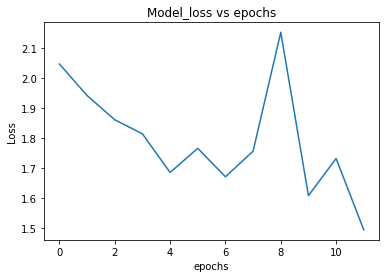

0
tensor([[-1.2421,  0.2081, -2.5567, -0.7390, -0.7032,  0.4418, -0.9596]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([0], device='cuda:0')
2.748124122619629
1
tensor([[-12.1476,  -1.5983,  13.0574,  -8.1491, -17.2182,  -9.7165,  -7.7073]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
2
tensor([[-6.7030, -1.5718,  5.1908, -5.9386, -6.6536, -3.4870, -3.2067]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
6.764235496520996
3
tensor([[-4.9626,  0.4650,  4.0804, -3.0994, -3.6132, -1.1091, -0.8492]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
3.655620574951172
4
tensor([[-2.7071,  1.7782, -8.4042, -1.3095, -0.0556,  2.2790, -2.0522]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.5599322319030762
5
tensor([[-2.7158,  0.1874, -7.2269, -1.2421, -0.6858,  1.5010, -3.3481]],
       device='cuda:0', grad_fn=<UnsqueezeBac

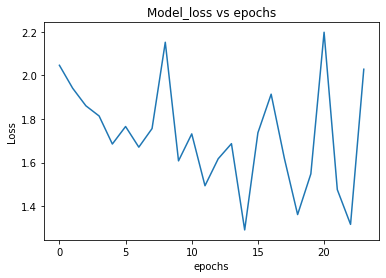

0
tensor([[ -7.1069,   1.6001,   6.7012,  -7.2129, -14.1003, -13.7571,  -6.5765]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.006075382232666016
1
tensor([[ -1.4660,  -1.2837,  12.0428,  -9.4424, -12.7089, -12.5899,  -5.0007]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
2.86102294921875e-06
2
tensor([[ -4.4840,  -2.5299, -12.9259,  -1.1328,   0.6624,   4.2185,  -3.3365]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.03455209732055664
3
tensor([[-1.6537,  1.6434, -2.2742, -2.4086, -4.6113, -4.0084, -1.6929]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
0.1090925931930542
4
tensor([[-11.3406,   5.0523,  22.2977, -15.3471, -29.7945, -33.8142, -10.1722]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
5
tensor([[-2.9962,  1.0771, -4.5923, -1.9433, -4.4902, -3.4364, -1.2602]],
       device='c

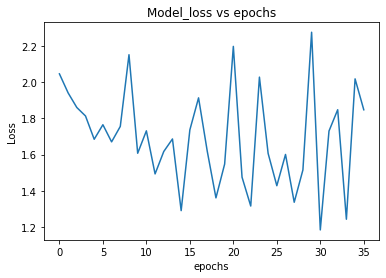

0
tensor([[ -3.1226,  -2.9762, -16.5578,  -1.2286,   0.2732,   2.7901,  -1.6608]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.10992097854614258
1
tensor([[-10.4540,   1.2759,  22.1739, -14.1761, -36.8298, -29.2825,  -8.7940]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
2
tensor([[ -7.2116,  -6.5996, -23.2687,  -0.8683,   2.5922,   5.8233,  -2.1247]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.040293216705322266
3
tensor([[-0.8683, -0.5509, -1.5485, -0.2673, -0.2114,  0.6523, -0.5094]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([0], device='cuda:0')
2.536825656890869
4
tensor([[ -3.4413,   6.1439,  -3.1139,  -5.8200, -14.1856, -15.7876,  -5.6941]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
0.0001773834228515625
5
tensor([[-0.6892,  0.0542, -1.2782, -0.1931, -0.4752, -0.5569, -0.1567]],
       device='c

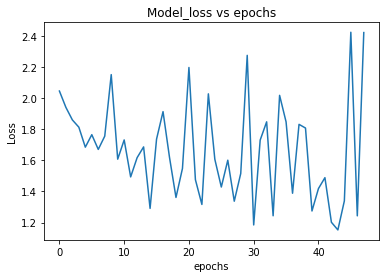

0
tensor([[ -3.3348, -11.4756, -47.5219,  -8.5217, -12.5086,  32.7749,  -7.2255]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.0
1
tensor([[ -6.0416,   4.1898, -13.8571,  -3.1877,  -8.9472,  -6.9165,  -1.9955]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
0.0027341842651367188
2
tensor([[-0.8926, -0.1595, -2.4937, -0.0234, -0.0609, -0.0986,  0.1607]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
1.8352835178375244
3
tensor([[-2.4642,  1.3806, -5.2493, -1.0825, -2.3867, -2.9279, -0.7193]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([3], device='cuda:0')
2.699706554412842
4
tensor([[ -9.4691, -16.7637, -56.7022,  -6.2280,  -2.7840,  23.3574,  -5.0392]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.0
5
tensor([[ -8.5817,   9.3927,  -7.1398, -10.2204, -31.4902, -27.1845,  -8.1203]],
       device='cuda:0', grad_fn=<U

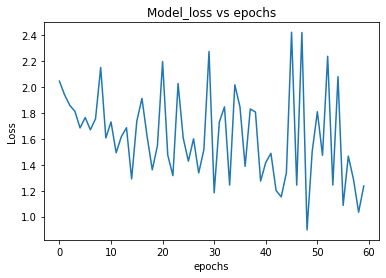

0
tensor([[-23.9564, -21.2364,  45.4286, -34.7700, -47.5528,  -1.6538,  -4.6291]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
1
tensor([[-0.6757, -0.2228, -1.3812,  0.0622, -0.0077, -0.3067,  0.0968]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([6], device='cuda:0')
1.5996160507202148
2
tensor([[-11.2454,  14.8294, -30.9039, -18.8435, -60.5110, -67.1393, -20.6899]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
0.0
3
tensor([[ -1.4431,   8.2610,  -5.8013,  -4.0468, -17.1873, -11.8881,  -3.1368]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
7.724761962890625e-05
4
tensor([[-0.6640,  3.7013, -2.9116, -1.5205, -8.8589, -7.6373, -0.9783]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
0.028343915939331055
5
tensor([[-0.9470, -0.2325, -1.9219,  0.0344,  0.1078, -0.4213,  0.0972]],
       device='cuda:0', grad_fn=<Unsqu

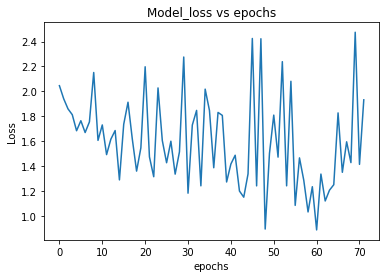

0
tensor([[-0.7192, -0.5063, -2.3628,  0.0488,  0.2943, -0.5268,  0.2404]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
2.199805736541748
1
tensor([[-0.8070, -0.5794, -2.4819,  0.0241,  0.1920, -0.3871,  0.1609]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([4], device='cuda:0')
1.4527370929718018
2
tensor([[ -5.2566,  -2.6757,  12.3113,  -8.0893, -19.6982,  -4.8000,  -3.4776]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
3
tensor([[-0.8124, -0.6778, -2.3002,  0.0664,  0.2982, -0.4659,  0.1640]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([4], device='cuda:0')
1.3644938468933105
4
tensor([[-1.9749, -2.3612, -4.1276, -0.4264,  0.1110,  1.8773, -0.6655]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([6], device='cuda:0')
2.8703691959381104
5
tensor([[ -3.1793,   3.9693,  -5.3259,  -2.1927, -11.2863,  -9.2718,  -3.7465]],
       device='cuda:0', grad_fn=<Uns

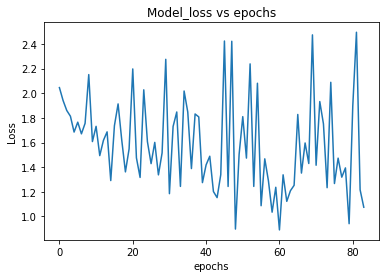

0
tensor([[-1.0821,  2.9740,  0.6741, -0.9171, -7.7557, -6.9422, -1.7262]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
0.1372981071472168
1
tensor([[ -4.0511,  -3.1856,   6.4385,  -6.2932, -14.6165,  -7.6326,  -2.6146]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.00021457672119140625
2
tensor([[ -7.0495,   0.8900,  20.5921, -10.7410, -36.2782, -16.3211,  -3.7787]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
3
tensor([[-0.7388, -0.5665, -1.9008,  0.0140,  0.1326, -0.4969,  0.1563]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([4], device='cuda:0')
1.5021207332611084
4
tensor([[-23.3094, -23.6559, -98.6222, -15.3446,  -5.7423,  25.2122, -14.5636]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.0
5
tensor([[ -5.6146,  -1.8800,  14.0961,  -8.7279, -24.8303, -11.3388,  -2.4644]],
       device='cuda:0', grad_fn=

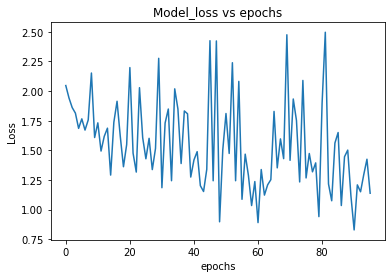

0
tensor([[-35.3013, -16.3057,  47.0143, -35.7376, -73.9769, -25.3979, -10.4550]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
1
tensor([[ -48.1413,  -43.1709,   73.5856,  -61.5453, -112.8404,  -51.2481,
          -19.3335]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
2
tensor([[-11.9447,  -0.9787,  22.7856,  -9.1532, -36.4071, -12.5569,  -4.8936]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
3
tensor([[-17.3655, -24.2767,  40.6951, -19.1639, -49.7802, -15.8751,  -8.5637]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
4
tensor([[-1.0760, -0.7172, -2.4754,  0.0332,  0.2832, -0.4350,  0.1395]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
2.058563709259033
5
tensor([[-1.0284, -0.8649, -2.6323, -0.0401,  0.3507, -0.1941,  0.2723]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tens

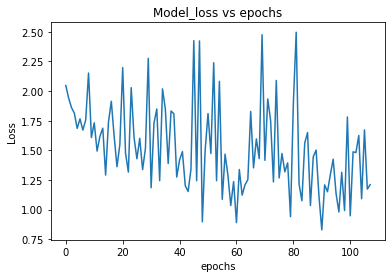

0
tensor([[ -7.9126,  -5.0251,  15.9503,  -7.4028, -34.8908, -16.3960,  -4.8227]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
1
tensor([[-12.6068,  17.3731, -19.9906, -17.7935, -78.4094, -64.6858, -29.7012]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
0.0
2
tensor([[-1.4396, -0.9158,  0.1586, -0.6159, -1.2081, -1.0665,  0.1559]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
1.2670948505401611
3
tensor([[ -4.0203,  11.0622,  -1.0992,  -7.1245, -44.6474, -31.2210, -11.8360]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
5.7220458984375e-06
4
tensor([[-0.8867, -0.6258, -2.2248,  0.0575,  0.1217, -0.4135,  0.1250]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
2.242809295654297
5
tensor([[-0.9787, -0.8550, -3.5570,  0.1425,  0.2168, -0.4955,  0.1480]],
       device='cuda:0', grad_fn=<UnsqueezeB

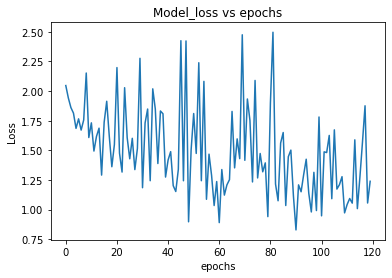

0
tensor([[-0.9687, -0.7528, -3.8905, -0.0101,  0.3627, -0.4103,  0.1814]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([0], device='cuda:0')
2.6096997261047363
1
tensor([[-0.7667, -0.5931, -3.1334,  0.1807,  0.2929, -0.6215,  0.1210]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([6], device='cuda:0')
1.5400768518447876
2
tensor([[-0.9601, -0.7755, -3.8262,  0.0101,  0.4183, -0.6206,  0.2620]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
2.430257558822632
3
tensor([[-17.2270, -25.9762, -60.1864, -13.9290,  -5.6270,  16.3438,  -7.2481]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.0
4
tensor([[-18.7677,  -9.8480,  26.6424, -20.2497, -59.3736, -28.8745, -14.4483]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
5
tensor([[-0.8364, -0.7359, -3.3589,  0.0651,  0.3027, -0.4713,  0.1446]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0

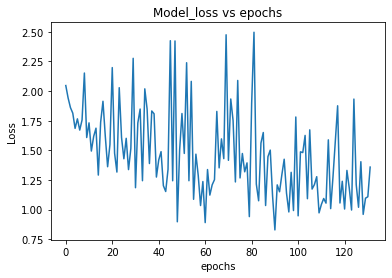

0
tensor([[ -48.1735,  -37.4820,   56.0286,  -68.4269, -129.5115,  -43.1974,
          -23.9313]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
1
tensor([[-1.3787, -0.6999, -1.5177, -1.0461, -2.6516, -1.4724, -0.2263]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([3], device='cuda:0')
1.9284268617630005
2
tensor([[-23.9787, -19.1691,  19.4083, -35.3827, -58.7399, -25.0415, -11.7096]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
3
tensor([[-0.9107, -0.6309, -2.9396,  0.0529, -0.0438, -0.6520,  0.2069]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([4], device='cuda:0')
1.6018723249435425
4
tensor([[-0.8436, -0.8850, -3.7094,  0.0418, -0.0372, -0.6090,  0.1641]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
2.134082317352295
5
tensor([[-12.4308,  19.6840, -27.1942, -25.3176, -83.0956, -56.4019, -27.8287]],
       device='cuda:0', grad_fn=<Un

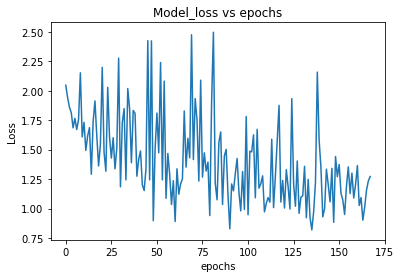

0
tensor([[-0.7437, -0.7479, -2.7101,  0.1777,  0.0227, -0.7001,  0.2453]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([3], device='cuda:0')
1.4332093000411987
1
tensor([[-0.8597, -0.7986, -2.7485,  0.1805,  0.1062, -0.4170,  0.2822]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([4], device='cuda:0')
1.5486476421356201
2
tensor([[ -66.7954,  -34.2860,   58.8085,  -81.8338, -112.7337,  -42.9779,
          -28.8000]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
3
tensor([[-45.3024, -18.8028,  43.3509, -54.3018, -92.8006, -25.5218, -21.0609]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
4
tensor([[-48.4121, -34.1181,  40.8710, -56.8847, -59.0878, -22.7562, -21.9433]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
5
tensor([[-0.7900, -0.8117, -3.0887,  0.1704,  0.1455, -0.6512,  0.3115]],
       device='cuda:0', grad_fn=<UnsqueezeBackwar

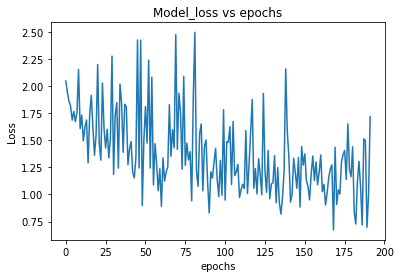

0
tensor([[-54.4408, -16.5114,  40.7771, -71.4358, -78.8633, -39.6816, -14.3476]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
1
tensor([[-47.5613, -14.5222,  33.2972, -67.7439, -89.7293, -45.0220, -18.1964]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
2
tensor([[-41.5876, -37.5175, -85.5011, -19.5963, -22.5229,  28.1147, -43.4958]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.0
3
tensor([[-0.9611, -0.4670, -3.2891, -0.0557, -1.6775, -1.5327, -0.3118]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([0], device='cuda:0')
2.1012825965881348
4
tensor([[ -74.9756,  -15.3397,   42.4564,  -94.3202, -140.0039,  -43.8991,
          -22.0759]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
5
tensor([[-0.9430, -0.8315, -3.2163,  0.1338, -0.1495, -0.5928,  0.2173]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
ten

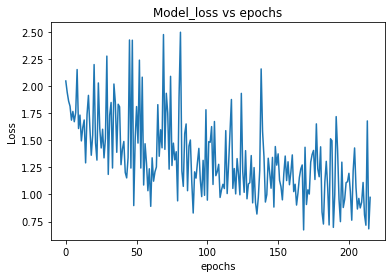

0
tensor([[-0.8301, -1.2168, -4.4620,  0.1667,  0.1243, -1.3267,  0.3336]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([6], device='cuda:0')
1.2179219722747803
1
tensor([[ -77.3093,  -63.0922, -223.5143,  -67.2184,  -64.7697,   39.4312,
         -102.1285]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.0
2
tensor([[-44.8696, -20.9489,  26.4955, -49.0637, -61.0033, -11.7299, -17.5153]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
47.444400787353516
3
tensor([[-0.8923, -1.2130, -4.3671,  0.2419,  0.1906, -1.4621,  0.3317]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([4], device='cuda:0')
1.3839033842086792
4
tensor([[-146.1257,  -81.4382,   83.1138, -192.7561, -196.9443,  -88.3920,
          -52.9388]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
5
tensor([[-2.1299, -0.6843, -2.1788, -1.2463, -3.0988, -2.5350, -1.2335]],
       device='cuda:0', g

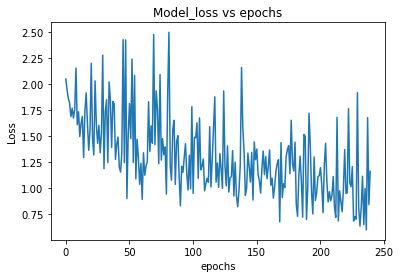

0
tensor([[-19.9095, -10.6390, -11.4832, -16.5300, -15.9978,   5.6439, -13.5520]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.0
1
tensor([[-30.2407, -11.3727,  18.7257, -27.5656, -41.9556,  -4.8673, -14.2527]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
2
tensor([[ -5.7014,   4.3022,  -8.3039,  -5.2185, -31.2551, -23.5267, -11.9364]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
0.0001220703125
3
tensor([[-161.6336,  -70.7879,   68.8892, -170.6073, -164.2605,  -53.5982,
          -70.4982]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
4
tensor([[ -75.7009,  -47.4821,   48.8087,  -85.6275, -116.3750,  -30.3820,
          -27.4489]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
5
tensor([[ -27.6500,   32.0437,  -21.8086,  -31.7381, -145.4704, -111.6027,
          -79.3269]], device='cuda:0', grad

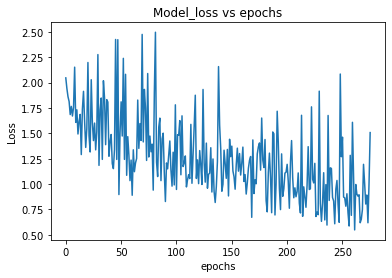

0
tensor([[-26.1802, -16.0276, -23.9105, -25.1224, -23.8663,   7.4318, -25.3671]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.0
1
tensor([[-28.1503, -20.0358,  13.6984, -39.6204, -74.3987, -41.9104, -19.7908]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
2
tensor([[-0.8587, -1.5816, -3.7223,  0.3425,  0.4263, -1.6154,  0.2912]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([4], device='cuda:0')
1.2088916301727295
3
tensor([[ -8.8775,  -8.4244, -15.9169,  -7.3091,  -4.7829,  -0.1066,  -3.1951]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.05451267585158348
4
tensor([[-0.9560, -1.7541, -4.1476,  0.2289,  0.3776, -1.6154,  0.2148]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([4], device='cuda:0')
1.1758570671081543
5
tensor([[-0.8981, -1.7799, -4.2872,  0.0319,  0.3086, -1.5859,  0.3847]],
       device='cuda:0', grad_fn=<Unsqueeze

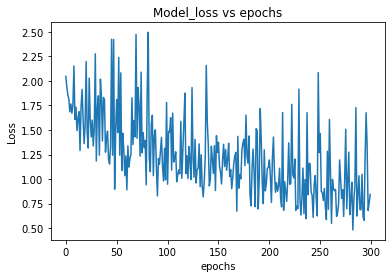

0
tensor([[-1.2541, -2.1088, -4.7969,  0.1607,  0.2674, -2.0097,  0.3767]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([6], device='cuda:0')
1.1245710849761963
1
tensor([[ -48.2659,  -23.1974, -117.2436,  -43.4610,  -45.6451,   22.5066,
          -79.0886]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.0
2
tensor([[ -14.9764,   18.2218,  -13.5109,  -28.1864, -186.4577, -134.2841,
         -100.3586]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
0.0
3
tensor([[-0.8127, -1.5196, -3.2090,  0.2989,  0.2402, -1.0049,  0.1729]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([6], device='cuda:0')
1.4117472171783447
4
tensor([[-0.9424, -1.6410, -3.6532,  0.2417,  0.1337, -1.3310,  0.2431]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([0], device='cuda:0')
2.4608960151672363
5
tensor([[ -1.8992,  -1.4303,  -6.8314,  -1.5621, -12.6197, -10.4960,  -7.4118]],
       device='cuda:0', g

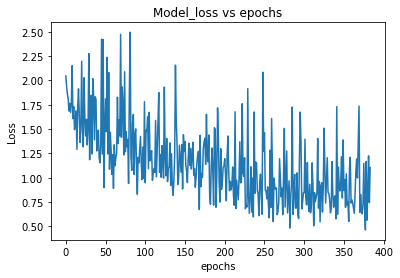

0
tensor([[-99.2183,  -8.4575,  15.5759, -99.5643, -92.5973, -12.0609, -37.3077]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
1
tensor([[-77.8954, -21.1264,  14.2280, -88.5176, -78.5518, -35.9145, -23.9369]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
2
tensor([[-128.4064,  -27.3607,   29.9372, -145.7416, -283.5331, -150.8285,
          -98.1313]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
3
tensor([[-0.9913, -1.6027, -4.4348, -0.1390, -2.3327, -3.3473, -2.6349]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([3], device='cuda:0')
0.6448758840560913
4
tensor([[-49.0171,  -8.5285,  17.8519, -46.2889, -73.5418, -26.6662, -14.7570]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
5
tensor([[ -25.1322,   10.8915,  -29.2212,  -30.8195, -168.2767, -117.4622,
         -119.6846]], device='cuda:0', grad_fn=<Unsqueez

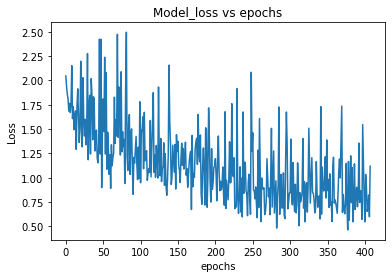

0
tensor([[-68.6454, -65.6573, -96.9535, -62.7452, -49.0417,  23.4872, -51.2286]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.0
1
tensor([[-1.0364, -1.4112, -3.1486,  0.2222,  0.1053, -1.2477,  0.5143]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([6], device='cuda:0')
1.08733332157135
2
tensor([[-142.2903,  -40.3389,   62.7403, -182.1691, -232.5920,  -90.5480,
          -42.2883]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
3
tensor([[-1.5588, -2.5664, -5.5291,  0.1062,  0.4061, -1.9583,  0.5741]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([0], device='cuda:0')
3.131690740585327
4
tensor([[-29.1688, -88.9619, -40.3195, -15.6426, -15.5676,  10.5002, -41.3479]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.0
5
tensor([[-1.2844, -1.8145, -4.1272,  0.1004,  0.3097, -1.5133,  0.5873]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>

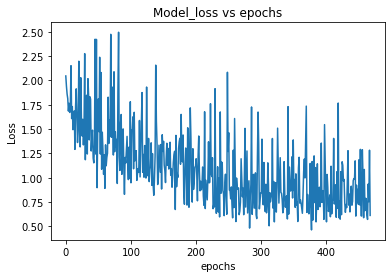

0
tensor([[-131.9053, -184.7046, -228.6316, -101.0327,  -85.9785,   41.2150,
         -141.2774]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.0
1
tensor([[-108.8289,  -48.4766,   40.0864, -124.8594, -188.7972,  -22.5241,
          -65.7772]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
2
tensor([[-123.0717,  -39.7361,   38.3102, -138.0576, -151.8929,  -19.4337,
          -55.9890]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
3
tensor([[-78.6565, -15.4025,  12.5772, -92.6096, -73.4740, -23.4897, -18.8605]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
4
tensor([[ -2.8316,  -3.5811,  -8.9894,  -2.0040, -16.8731, -15.2527, -12.8220]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([3], device='cuda:0')
0.497499942779541
5
tensor([[-14.1477,   2.8407, -32.4922, -13.3981, -99.1983, -74.1014, -79.8737]],
       device='cuda:0', gr

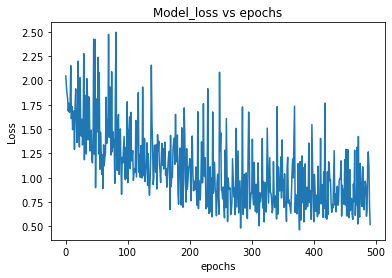

0
tensor([[-1.5245, -1.8568, -3.2507, -0.1703,  0.3275, -1.9228,  0.5398]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([3], device='cuda:0')
1.6755884885787964
1
tensor([[-207.2913, -304.0314, -290.6229, -189.5310, -191.2402,   66.0268,
         -305.5375]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.0
2
tensor([[ -20.8123,   23.4380,  -24.2887,  -46.1470, -286.8135, -209.9224,
         -202.2567]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
0.0
3
tensor([[ -4.8929,  -2.5940, -11.6771,  -7.5437, -19.8331, -17.7724, -14.2757]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([0], device='cuda:0')
2.4010374546051025
4
tensor([[-254.9233, -107.9030,   61.8713, -328.5584, -313.5354, -157.1567,
          -88.0064]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
5
tensor([[-68.7456, -53.6154, -33.6950, -62.5455, -49.4045,   8.0415, -41.0125]],
       device='cu

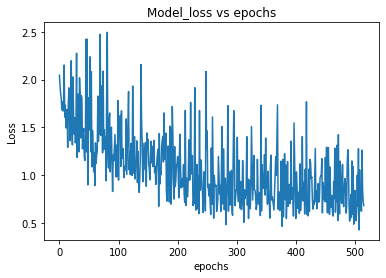

0
tensor([[-242.8112,  -60.2197,   64.6483, -307.1044, -281.1419, -114.4061,
          -70.4755]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
1
tensor([[-207.7259,  -52.3414,   69.6091, -267.3826, -248.9948,  -76.2682,
          -50.0065]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
2
tensor([[-268.4705,  -91.5073,   65.6612, -326.2928, -338.4925, -166.4495,
          -89.1000]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
3
tensor([[-38.0009,  -1.0990,   7.3431, -44.5658, -45.8260, -23.5419,  -7.4289]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.00021600723266601562
4
tensor([[ -98.7869, -131.6607,  -56.0254,  -74.0014,  -94.0729,   19.1567,
         -126.2100]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.0
5
tensor([[ -82.3557,  -83.7129,  -76.8908, -141.5778, -137.2420,   38.5737,
         -174.4919

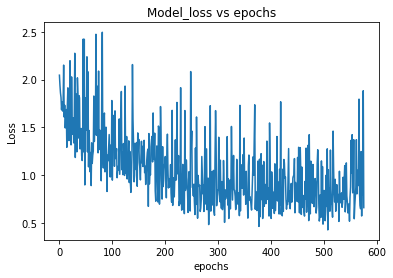

0
tensor([[ -39.0855,   22.6194,  -48.8421,  -47.1304, -322.1395, -231.9176,
         -268.4113]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([1], device='cuda:0')
0.0
1
tensor([[-56.7886, -17.7396,  11.6751, -68.5953, -74.9877, -33.0724, -20.9391]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
2
tensor([[-146.6679,   -4.0465,   60.0229, -216.0061, -194.6701,  -62.9902,
          -47.7192]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
3
tensor([[ -43.6868,  -84.1300, -103.5299,  -34.7762,  -51.4311,    6.1593,
         -101.8300]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([5], device='cuda:0')
0.0
4
tensor([[-188.0011,  -53.2072,   48.9709, -238.9250, -221.5709,  -62.3819,
          -84.0723]], device='cuda:0', grad_fn=<UnsqueezeBackward0>)
tensor([2], device='cuda:0')
0.0
5
tensor([[-1.6671, -1.9119, -3.5347, -0.8530,  0.0372, -2.0448,  0.1037]],
       device='cuda:0', grad_fn=<Unsqu

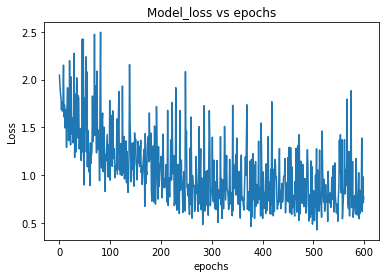

In [6]:
model = Net(7)
for name, param in model.named_parameters():
    if param.requires_grad:
        print(name, param.data)
        
model.to(device)
max_epochs = 50
import torch.optim as optim
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(),lr = 0.0008,betas=(0.9, 0.999))
loss_list = []
for epochs in range(max_epochs):
    #print('e =',epochs)
    running_loss = 0.0
    print(dataLoad)
    for i,data in enumerate(dataLoad,0):
        print(i)
        #print(data[0].shape)
        x,y = data
        x = x[0].float().to(device)
        #y = y.float()
        y = y[0].to(device)
        optimizer.zero_grad()
        yhat = model(x)
        print(yhat)
        print(y)
        loss = criterion(yhat,y)
        print(loss.item())
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 0.5)
        optimizer.step()

        running_loss += loss.item()
        if i % 200 == 199:    # print every 2000 mini-batches
            print('[%d, %5d] loss: %.3f' % (epochs + 1, i + 1, running_loss / 200))
            loss_list.append(running_loss/200)
            running_loss = 0.0
    #print(running_loss)
    import matplotlib.pyplot as plt
    plt.plot(loss_list)
    plt.title('Model_loss vs epochs')
    plt.ylabel('Loss')
    plt.xlabel('epochs')
    s = '../working/epochwise_loss_' + str(epochs)
    plt.savefig(s)
    plt.show()
    plt.close()
    torch.save(model.state_dict(), '../working/new_mod.pth')